# 1. 이미지 매칭
 - 평균 해시 매칭(Average Hash Matching)

# 2.이미지 특징점 검출
 - 해리스 코너 검출(Harris Corner Detection)
 - 시-토마시 검출(Shi & Tomasi Detection)
 - GFTTDetector
 - FAST(Feature from Accelerated Segment Test)
 - SimpleBlobDetector

#### 라이브러리

In [3]:
# installs
!pip install pytesseract
!pip install pafy
!pip install youtube_dl


# pytorch
import torch


# OpenCV, OCR
import cv2
import pytesseract
from skimage.transform import resize


# Youtube video
import pafy
import cv2


# Visualizatipn
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.rc('font', family='malgun gothic')
plt.rc('axes', unicode_minus=False)

# time
from time import time

#### 차량 진입 사진 로드

출력 예시2개 비교

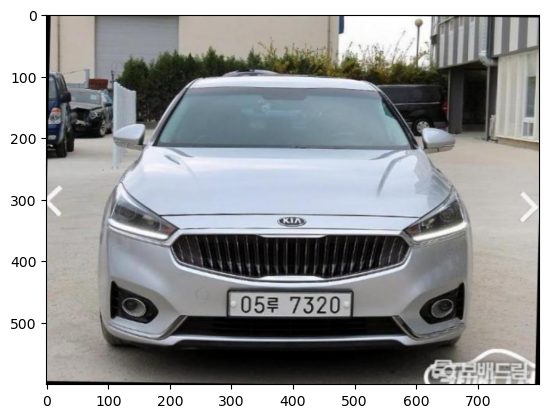

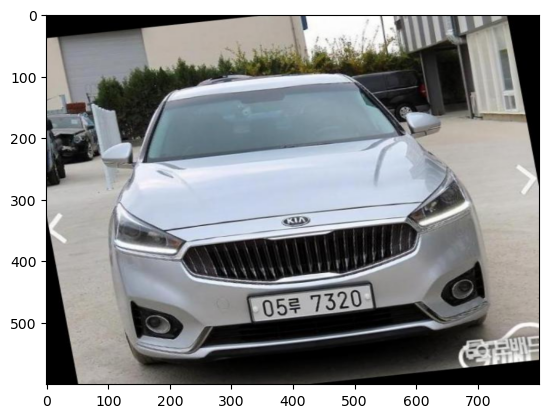

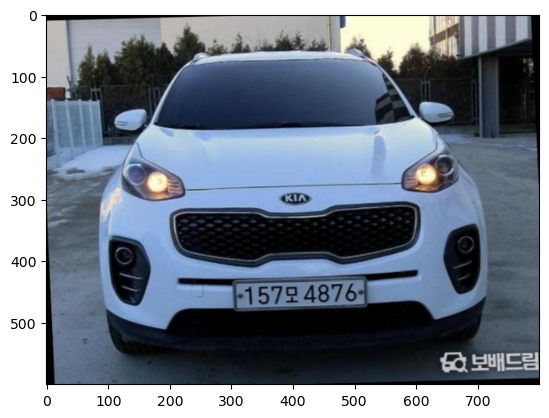

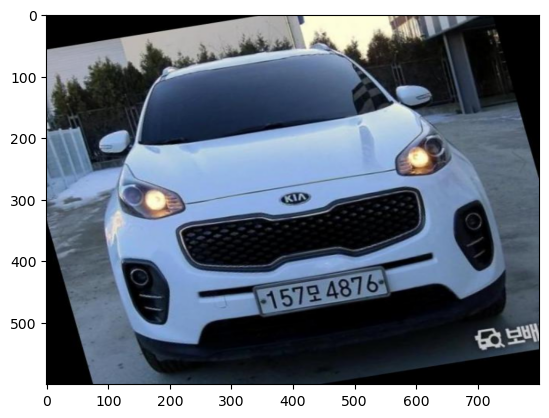

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# imread 함수 정의: 이미지 로드 및 크기 조정
def imread(filename, flags=cv2.IMREAD_COLOR, dtype=np.uint8, resize_dim=(800, 600)):
    """
    파일 경로를 읽어 이미지를 로드하고, 크기를 조정합니다.
    :param filename: 이미지 파일 경로
    :param flags: OpenCV 이미지 로드 플래그 (기본값: cv2.IMREAD_COLOR)
    :param dtype: 데이터 타입 (기본값: np.uint8)
    :param resize_dim: 이미지 크기 조정 (너비, 높이)
    :return: 로드된 이미지 또는 None
    """
    try:
        n = np.fromfile(filename, dtype)  # 한글 경로 지원을 위해 np.fromfile 사용
        img = cv2.imdecode(n, flags)     # 이미지 디코딩
        if img is not None and resize_dim:  # 이미지가 로드되었고 크기 조정 설정이 있을 때
            img = cv2.resize(img, resize_dim)
        return img
    except Exception as e:
        print(f"Error reading file {filename}: {e}")
        return None

# 이미지 파일 경로 설정
file1 = r"C:\Users\User\Documents\박준성\whitecar1.jpg"
file2 = r"C:\Users\User\Documents\박준성\whitecar2.jpg"
file3 = r"C:\Users\User\Documents\박준성\lightcar1.jpg"
file4 = r"C:\Users\User\Documents\박준성\lightcar2.jpg"

# 이미지 로드
whitecar01 = imread(file1, resize_dim=(800, 600))  # 크기를 800x600으로 조정
whitecar02 = imread(file2, resize_dim=(800, 600))  # 크기를 800x600으로 조정
lightcar01 = imread(file3, resize_dim=(800, 600))     # 크기를 800x600으로 조정
lightcar02 = imread(file4, resize_dim=(800, 600))     # 크기를 800x600으로 조정

# 이미지 출력
plt.imshow(cv2.cvtColor(whitecar01, cv2.COLOR_BGR2RGB))
plt.show()

plt.imshow(cv2.cvtColor(whitecar02, cv2.COLOR_BGR2RGB))
plt.show()

plt.imshow(cv2.cvtColor(lightcar01, cv2.COLOR_BGR2RGB))
plt.show()

plt.imshow(cv2.cvtColor(lightcar02, cv2.COLOR_BGR2RGB))
plt.show()


In [5]:
import numpy as np

In [7]:
car_images = [whitecar01, whitecar02, lightcar01, lightcar02]

### 1. 이미지 매칭
#### 평균 해시 매칭(Average Hash Matching)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
3feffffffffffe00000000000000000000000001fffffffffffffffffffffffffffffffffff800000000000000000000000000000000000000000000000000000000000000000000000003feffffffffffe00000000000000000000000003fffffffffffffffffffffffffffffffffffffffffffffbff81fffffffffffffffffffe0000000000000000000000000000000000000003feffffffffffe00000000000000000000000003fffffffffffffffffffffffffffffffffffffffffffffbff81ffffffffffffffffffffffffffdf8fe3f00080840c800000000000000003ffffffffffffe00000000000000000000000003fffffffffffffffffffffffffffffffffffffffffffff3ff83ffffffffffffffffffffffffffdf8fc7803381fe1ff801ff007ff001ffe3feffffffffffe00000000000000000000000003fffffffffffffffffffffffffffffffffffffffffffff3ff81ffffffffffffffffffffffffffdf8ff8003381fe1ff801ff007ff003ffe3ffffffffffffe00000000000000000000000003fffffffffffffffffffffffffffffffffffffffffffff3ff81ffffffffffffffffffffffffffdf8fc0003b81fe1ff80

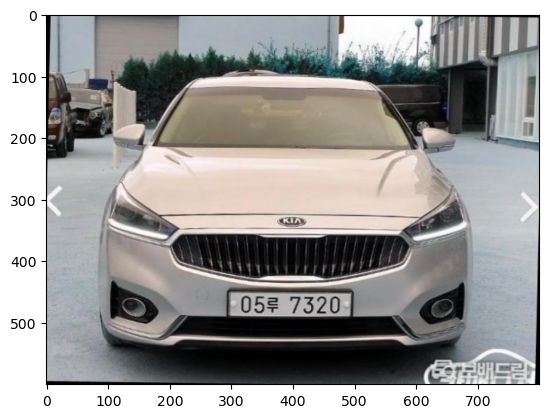

In [12]:
#영상 읽어서 그레이 스케일로 변환
car_image = whitecar01
copy_img = car_image.copy()
gray = cv2.cvtColor(copy_img, cv2.COLOR_BGR2GRAY)

# 8x8 크기로 축소 ---①
gray = cv2.resize(gray, (600,300)) # 원하는 크기로 조정 
# 영상의 평균값 구하기 ---②
avg = gray.mean()
# 평균값을 기준으로 0과 1로 변환 ---③
bin = 1 * (gray > avg)
print(bin)

"""수업 내용 중 지능형 리스트를 사용하여 dhash 생성"""
dhash = ''.join('%02x' % int(''.join(map(str, row)), 2) for row in bin.tolist())
print(dhash)
# 원래문단dhash = []
# for row in bin.tolist():
#     s = ''.join([str(i) for i in row])
#     dhash.append('%02x' % (int(s, 2)))
# dhash = ''.join(dhash)



plt.imshow(copy_img)
plt.show()

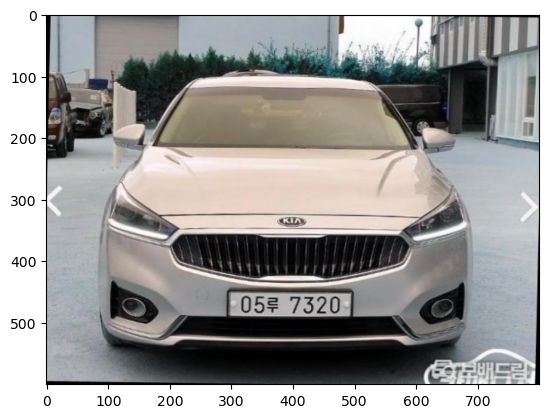

197.54296875


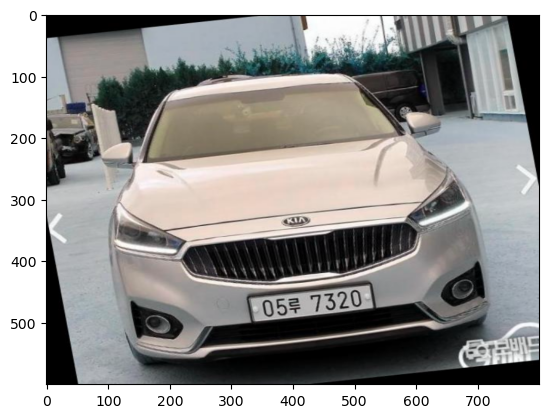

In [14]:
# 영상 읽기 및 표시
img = whitecar01
plt.imshow(img)
plt.show()

# 비교할 영상들이 있는 경로 ---①
search_dir = r'C:\Users\js0309\Documents\박준성\차량번호판-최종-1\test\images'

# 이미지를 16x16 크기의 평균 해쉬로 변환 ---②
def img2hash(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray, (600, 300))
    avg = gray.mean()
    bi = 1 * (gray > avg)
    return bi

# 해밍거리 측정 함수 ---③
def hamming_distance(a, b):
    a = a.reshape(1,-1)
    b = b.reshape(1,-1)
    # 같은 자리의 값이 서로 다른 것들의 합
    distance = (a !=b).sum()
    return distance

# 차 영상의 해쉬 구하기 ---④
query_hash = img2hash(img)

# 이미지 데이타 셋 디렉토리의 모든 영상 파일 경로 ---⑤
# 데이타 셋 영상 한개 읽어서 표시 ---⑥
img = whitecar02
# 데이타 셋 영상 한개의 해시  ---⑦
a_hash = img2hash(img)
# 해밍 거리 산출 ---⑧
dst = hamming_distance(query_hash, a_hash)
print(dst/256)
if dst/256 < 200: # 해밍거리 25% 이내만 출력 ---⑨
    plt.imshow(img)
    plt.show()
        


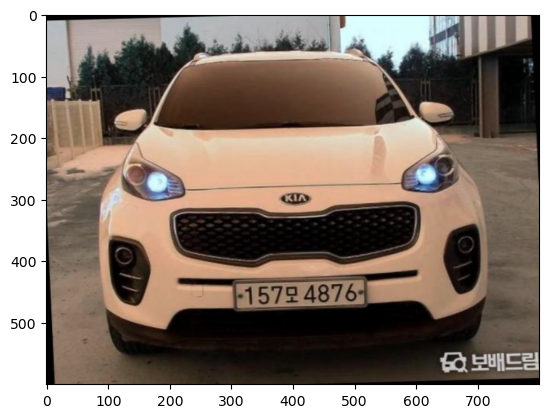

204.72265625


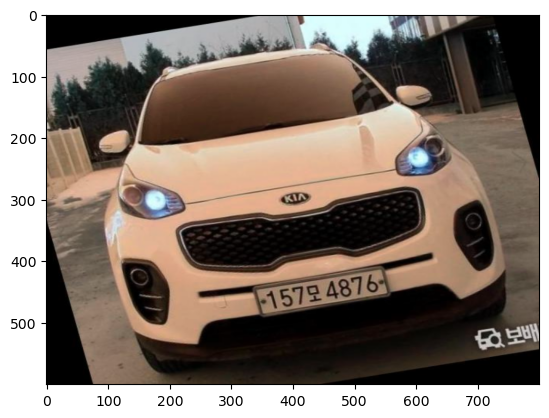

In [18]:
# 영상 읽기 및 표시
img = lightcar01
plt.imshow(img)
plt.show()

# 비교할 영상들이 있는 경로 ---①
search_dir = r'C:\Users\js0309\Documents\박준성\차량번호판-최종-1\test\images'

# 이미지를 16x16 크기의 평균 해쉬로 변환 ---②
def img2hash(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray, (600, 300))
    avg = gray.mean()
    bi = 1 * (gray > avg)
    return bi

# 해밍거리 측정 함수 ---③
def hamming_distance(a, b):
    """수업 내용 중 제너레이터 표현식으로 해밍 거리 계산"""
    distance = sum(1 for x, y in zip(a.flatten(), b.flatten()) if x != y)
    #기존 코드
    # a = a.reshape(1, -1)
    # b = b.reshape(1, -1)
    # distance = (a != b).sum()
    return distance

# 차 영상의 해쉬 구하기 ---④
query_hash = img2hash(img)

# 이미지 데이타 셋 디렉토리의 모든 영상 파일 경로 ---⑤
# 데이타 셋 영상 한개 읽어서 표시 ---⑥
img = lightcar02
# 데이타 셋 영상 한개의 해시  ---⑦
a_hash = img2hash(img)
# 해밍 거리 산출 ---⑧
dst = hamming_distance(query_hash, a_hash)
print(dst/256)
if dst/256 < 205: # 해밍거리 25% 이내만 출력 ---⑨ ##해밍거리 205로 수정
    plt.imshow(img)
    plt.show()
        


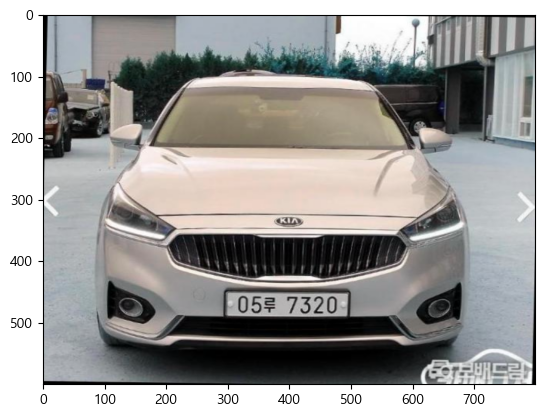

257.00390625


In [187]:
# 영상 읽기 및 표시
img = whitecar01
plt.imshow(img)
plt.show()

# 비교할 영상들이 있는 경로 ---①
search_dir = r'C:\Users\js0309\Documents\박준성\차량번호판-최종-1\test\images'

# 이미지를 16x16 크기의 평균 해쉬로 변환 ---②
def img2hash(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray, (600, 300))
    avg = gray.mean()
    bi = 1 * (gray > avg)
    return bi

# 해밍거리 측정 함수 ---③
def hamming_distance(a, b):
    a = a.reshape(1,-1)
    b = b.reshape(1,-1)
    # 같은 자리의 값이 서로 다른 것들의 합
    distance = (a !=b).sum()
    return distance

# 차 영상의 해쉬 구하기 ---④
query_hash = img2hash(img)

# 이미지 데이타 셋 디렉토리의 모든 영상 파일 경로 ---⑤
# 데이타 셋 영상 한개 읽어서 표시 ---⑥
img = lightcar01
# 데이타 셋 영상 한개의 해시  ---⑦
a_hash = img2hash(img)
# 해밍 거리 산출 ---⑧
dst = hamming_distance(query_hash, a_hash)
print(dst/256)
if dst/256 < 200: # 해밍거리 25% 이내만 출력 ---⑨
    plt.imshow(img)
    plt.show()
        


### 2. 이미지 특징점 검출
#### 해리스 코너 검출(Harris Corner Detection)

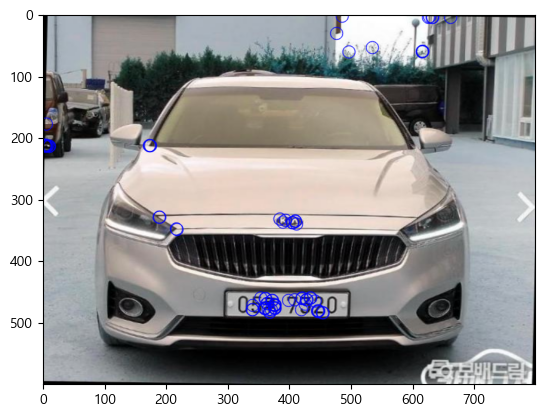

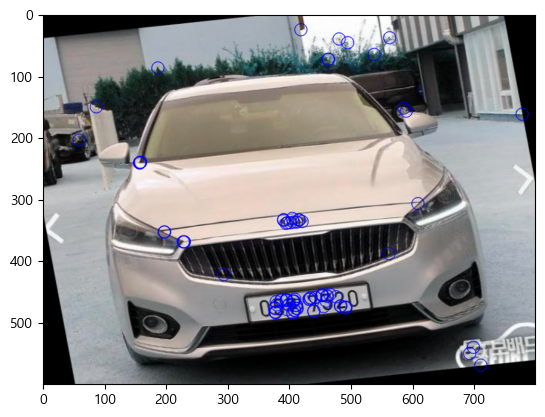

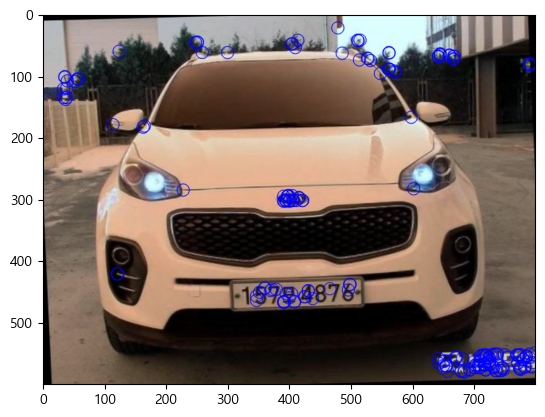

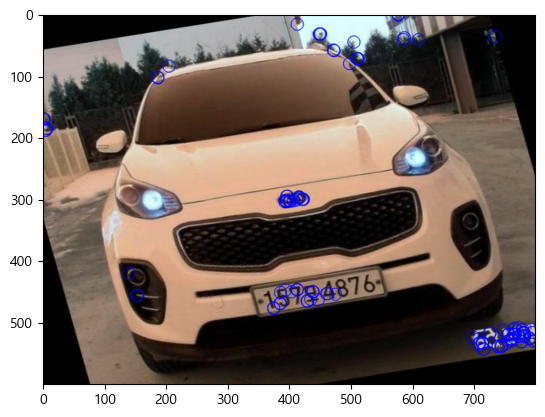

In [190]:
for car_image in car_images:
    
    # 해리스 코너 검출 (corner_harris.py)
    copy_img = car_image.copy()
    gray = cv2.cvtColor(copy_img, cv2.COLOR_BGR2GRAY)

    # 해리스 코너 검출 ---①
    corner = cv2.cornerHarris(gray, 2, 3, 0.1)
    # 변화량 결과의 최대값 10% 이상의 좌표 구하기 ---②
    coord = np.where(corner > 0.15* corner.max())
    coord = np.stack((coord[1], coord[0]), axis=-1)

    # 코너 좌표에 동그리미 그리기 ---③
    for x, y in coord:
        cv2.circle(copy_img, (x,y), 10, (0,0,255), 1, cv2.LINE_AA)

    plt.imshow(copy_img)
    plt.show()

#### 시-토마시 검출(Shi & Tomasi Detection)

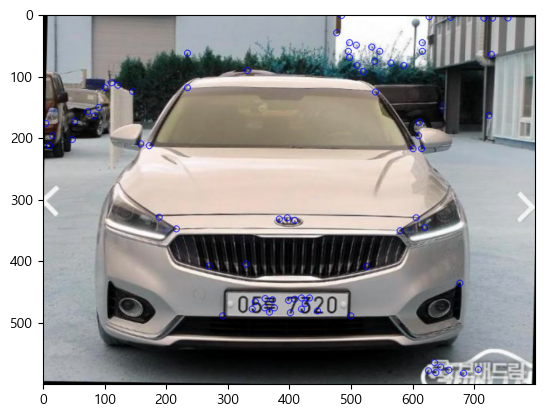

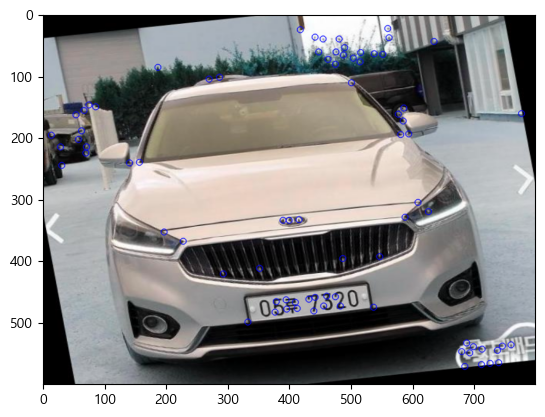

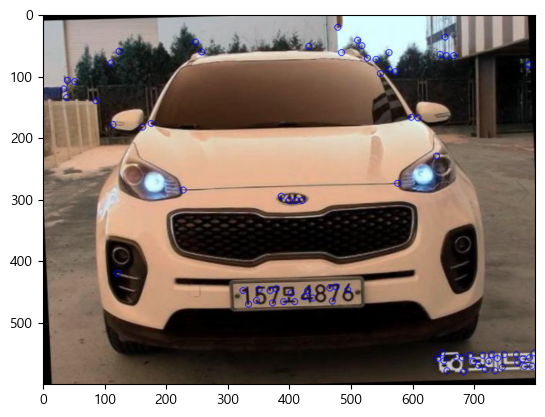

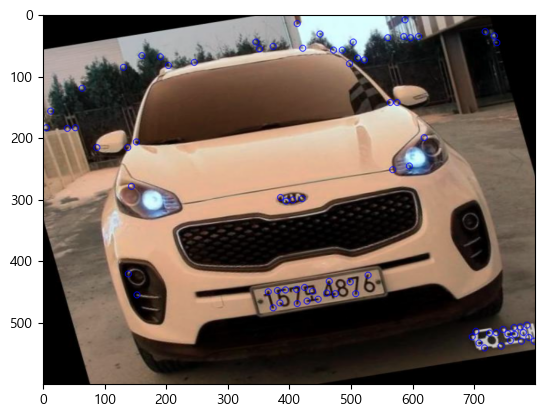

In [193]:
for car_image in car_images:
    
    # 시와 토마시 코너 검출 (corner_goodFeature.py)
    copy_img = car_image.copy()
    gray = cv2.cvtColor(copy_img, cv2.COLOR_BGR2GRAY)

    # 시-토마스의 코너 검출 메서드
    corners = cv2.goodFeaturesToTrack(gray, 80, 0.01, 10)
    # 실수 좌표를 정수 좌표로 변환
    corners = np.int32(corners)

    # 좌표에 동그라미 표시
    for corner in corners:
        x, y = corner[0]
        cv2.circle(copy_img, (x, y), 5, (0,0,255), 1, cv2.LINE_AA)

    plt.imshow(copy_img)
    plt.show()

#### GFTTDetector

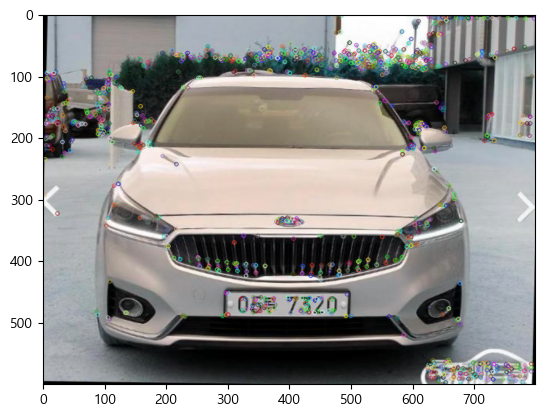

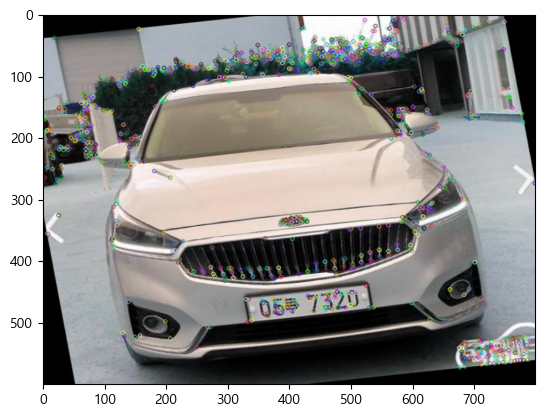

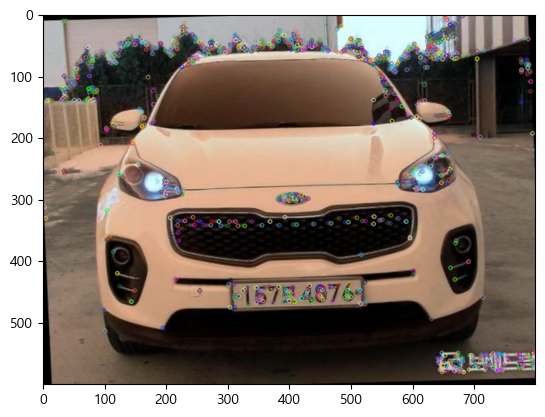

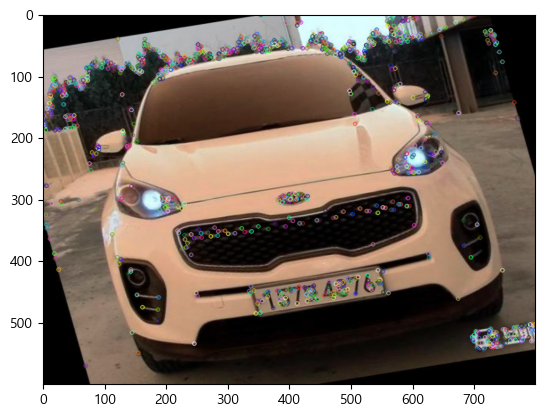

In [196]:
for car_image in car_images:

    # GFTTDetector로 특징점 검출 (kpt_gftt.py)
    copy_img = car_image.copy()
    gray = cv2.cvtColor(copy_img, cv2.COLOR_BGR2GRAY)

    # Good feature to trac 검출기 생성 ---①
    gftt = cv2.GFTTDetector_create() 
    # 특징점 검출 ---②
    keypoints = gftt.detect(gray, None)
    # 특징점 그리기 ---③
    img_draw = cv2.drawKeypoints(copy_img, keypoints, None)

    # 결과 출력 ---④
    plt.imshow(img_draw)
    plt.show()

#### FAST(Feature from Accelerated Segment Test)

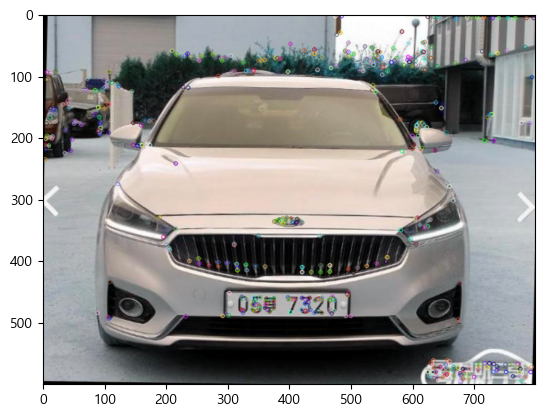

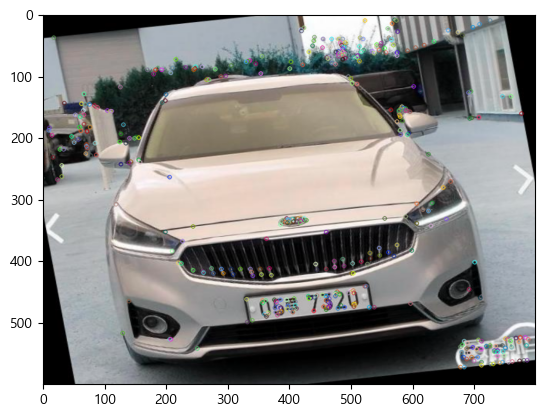

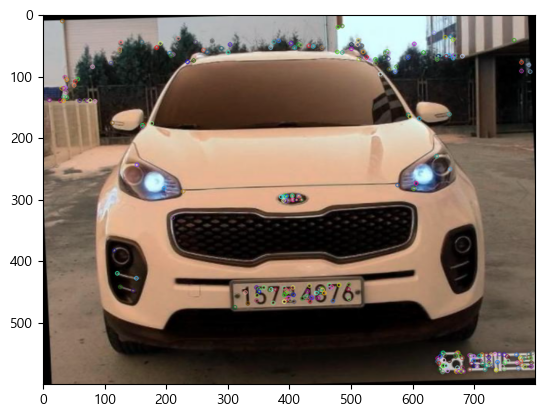

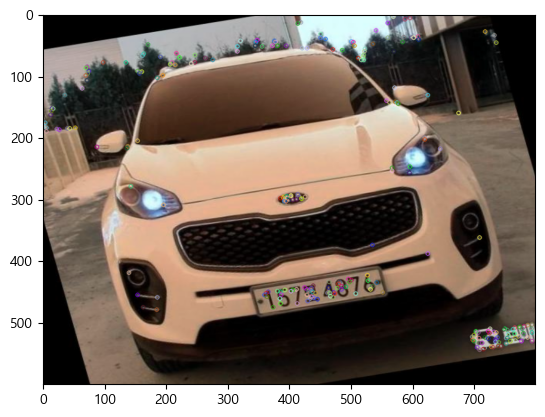

In [199]:
for car_image in car_images:

    # FAST로 특징점 검출 (kpt_fast.py)
    copy_img = car_image.copy()
    gray = cv2.cvtColor(copy_img, cv2.COLOR_BGR2GRAY)

    # FASt 특징 검출기 생성 ---①
    fast = cv2.FastFeatureDetector_create(50)
    # 특징점 검출 ---②
    keypoints = fast.detect(gray, None)
    # 특징점 그리기 ---③
    draw_img = cv2.drawKeypoints(copy_img, keypoints, None)
    # 결과 출력 ---④
    plt.imshow(draw_img)
    plt.show()

#### SimpleBlobDetector

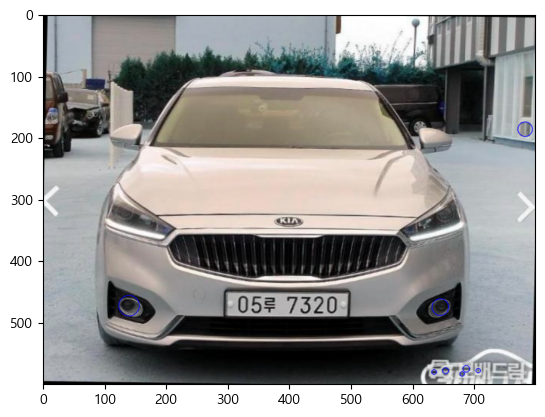

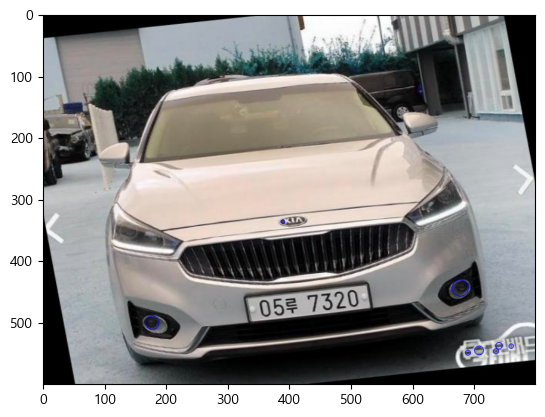

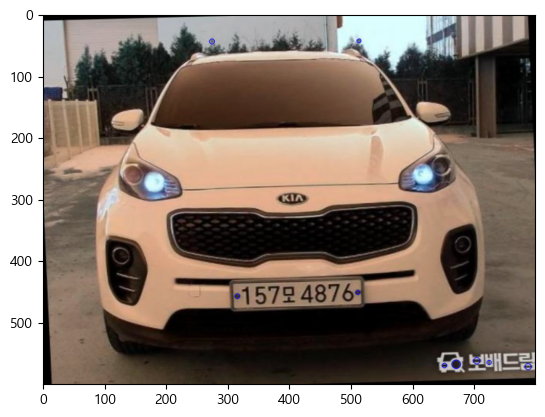

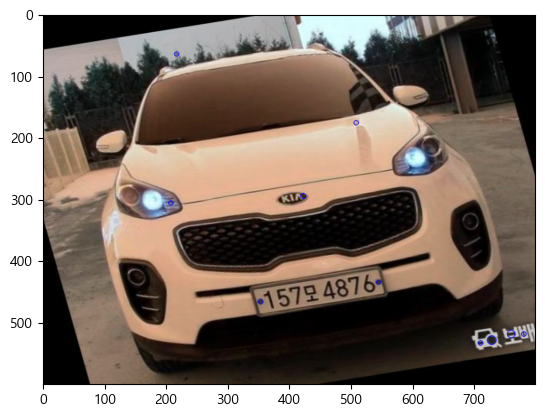

In [202]:
for car_image in car_images:

    # SimpleBolbDetector 검출기 (kpt_blob.py)
    copy_img = car_image.copy()
    gray = cv2.cvtColor(copy_img, cv2.COLOR_BGR2GRAY)

    # SimpleBlobDetector 생성 ---①
    detector = cv2.SimpleBlobDetector_create()
    # 키 포인트 검출 ---②
    keypoints = detector.detect(gray)
    # 키 포인트를 빨간색으로 표시 ---③
    draw_img = cv2.drawKeypoints(copy_img, keypoints, None, (0,0,255),\
                    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    # 결과 출력 ---④
    plt.imshow(draw_img)
    plt.show()

#### SimpleBlobDetector 필터 옵션 주어 실행

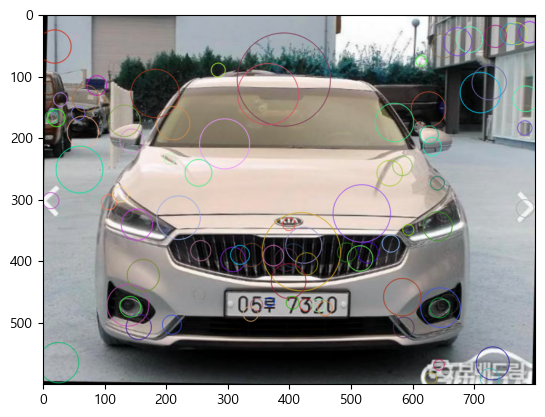

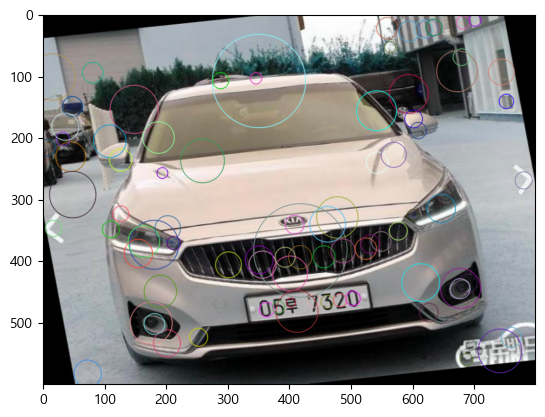

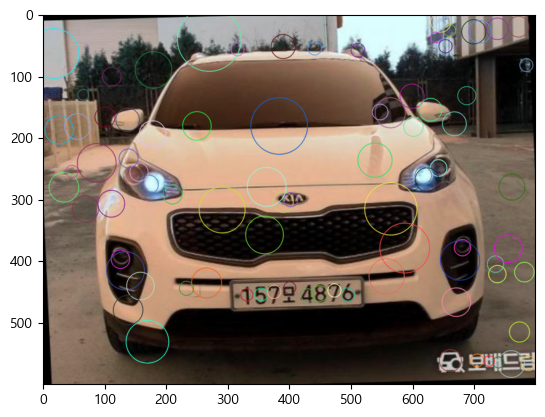

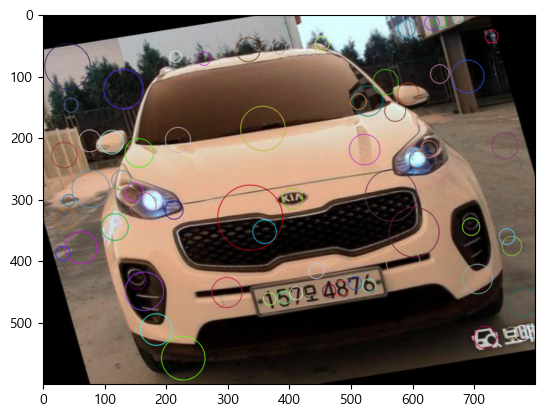

In [205]:
for car_image in car_images:

    # 필터 옵션으로 생성한 SimpleBlobDetector 검출기 (kpt_blob_param.py)
    copy_img = car_image.copy()
    gray = cv2.cvtColor(copy_img, cv2.COLOR_BGR2GRAY)

    # blob 검출 필터 파라미터 생성 ---①
    params = cv2.SimpleBlobDetector_Params()

    # 경계값 조정 ---②
    params.minThreshold = 10
    params.maxThreshold = 240
    params.thresholdStep = 5
    # 면적 필터 켜고 최소 값 지정 ---③
    params.filterByArea = True
    params.minArea = 200

    # 컬러, 볼록 비율, 원형비율 필터 옵션 끄기 ---④
    params.filterByColor = False
    params.filterByConvexity = False
    params.filterByInertia = False
    params.filterByCircularity = False 

    # 필터 파라미터로 blob 검출기 생성 ---⑤
    detector = cv2.SimpleBlobDetector_create(params)
    # 키 포인트 검출 ---⑥
    keypoints = detector.detect(gray)
    # 키 포인트 그리기 ---⑦
    draw_img = cv2.drawKeypoints(copy_img, keypoints, None, None,\
                         cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    # 결과 출력 ---⑧
    plt.imshow(draw_img)
    plt.show()

### 1. 평균 해시 매칭 (Average Hash Matching)
#### 핵심 설명: 평균 해시 매칭은 이미지를 축소하고 이진화하여 고유한 해시값으로 변환하는 이미지 매칭 알고리즘입니다. 이 방법은 이미지의 전체적인 특징을 압축된 형태로 표현하며, 이미지 유사성을 빠르고 간단하게 비교하는 데 적합합니다

#### 알아두어야 할 점:평균 해시는 이미지의 전반적인 특징만을 추출하므로 연산이 간단하고 속도가 빠르다. 하지만 회전, 스케일 변경, 밝기 조정 등 이미지의 구조적 변형에 취약할 수 있습니다. 정확한 매칭보다는 이미지의 대략적인 유사성을 확인하는 데 적합합니다.


###  2. 해리스 코너 검출 (Harris Corner Detection)
#### 핵심 설명: 해리스 코너 검출은 이미지의 코너(강한 에지와 에지가 교차하는 지점)를 탐지하는 알고리즘입니다. 픽셀 강도의 변화량을 계산하여 코너를 강조하고, 이를 기반으로 이미지의 주요 특징점을 찾습니다.

#### 알아두어야 할 점: 비교적 단순하고 빠르지만, 스케일 불변성과 회전 불변성을 지원하지 않습니다. 특정 임계값 이상인 좌표를 추출하며 너무 낮은 임계값을 설정하면 노이즈가 포함될 수 있습니다.

###  3. 시-토마시 코너 검출 (Shi & Tomasi Detection)
#### 핵심 설명: 시-토마시는 해리스 코너 검출을 개선한 방법으로 코너의 강도를 더 효율적으로 계산하여 중요한 특징점을 검출합니다. 이미지의 작은 영역에서 픽셀 변화량을 분석하여 가장 유의미한 코너를 선택합니다.

#### 알아두어야 할 점: 간단하면서도 효과적이며 해리스 코너보다 노이즈에 강하다. 하지만 회전과 스케일에 불변하지 않아 다양한 변형된 조건에서 약점이 있을 수 있습니다.

###  4. GFTT (Good Features to Track Detector)
#### 핵심 설명: GFTT는 시-토마시 알고리즘을 기반으로 한 OpenCV의 기본 구현입니다. 중요한 특징점을 빠르게 검출하며 주로 추적 알고리즘에서 사용됩니다.

#### 알아두어야 할 점: 이미지 내 추적하기 좋은 코너를 검출하여, 동영상 분석이나 객체 추적에 적합합니다. 강력한 코너 검출 능력을 갖추었지만, 회전이나 스케일 변화에는 약할 수 있습니다.


###  5. FAST (Features from Accelerated Segment Test)
#### 핵심 설명: FAST는 코너와 같은 특징점을 빠르게 검출하기 위한 알고리즘입니다. 각 픽셀 주변의 강도 차이를 분석하여 코너 여부를 판단합니다.

#### 알아두어야 할 점: 매우 빠르고 간단하지만 노이즈가 있는 데이터에서는 성능이 저하될 수 있습니다. 스케일 불변성을 지원하지 않지만 회전 불변성을 가지고 있습니다.


###  6. SimpleBlobDetector
#### 핵심 설명: SimpleBlobDetector는 이미지에서 밝기 변화로 형성된 블롭을 감지합니다. 블롭은 둥글거나 불규칙한 모양의 영역으로, 객체 탐지와 이미지 분석에 유용합니다.

#### 알아두어야 할 점: 블롭 탐지는 이미지에서 중요한 모양이나 영역을 찾는 데 적합합니다. 기본 설정에서는 단순히 블롭을 탐지하며 필터를 추가하여 특정 크기, 모양, 색상 등의 기준을 설정할 수 있습니다.


###  7. 필터 옵션을 적용한 SimpleBlobDetector
#### 핵심 설명: 필터 옵션이 적용된 SimpleBlobDetector는 특정 조건(예: 크기, 밝기, 모양)에 맞는 블롭만 탐지합니다. 필터를 조정하여 필요한 특징만 추출할 수 있습니다.

#### 알아두어야 할 점: 필터를 통해 특정 조건의 블롭을 탐지할 수 있지만 필터 설정이 부적절하면 중요한 특징이 누락될 수 있습니다. 다양한 조건을 세부적으로 설정할 수 있어 유연성이 높습니다.


### 요약
#### 이미지 특징점 검출은 이미지의 중요한 점을 찾아내는 기술로 각 알고리즘은 속도, 정확도, 변형에 대한 대응 능력에서 차이를 보입니다. 
#### 해리스 코너 검출은 빠르고 간단하지만 스케일과 회전에 민감하고 시-토마시 검출은 정확도가 더 높습니다. GFTT는 추적하기 좋은 특징점을 찾는 데 적합하고, FAST는 빠른 검출로 실시간 애플리케이션에 유용하지만 복잡한 환경에서 한계가 있습니다.SimpleBlobDetector는 블롭 형태의 특징을 탐지하며, 필터 옵션으로 특정 조건의 특징을 선택적으로 탐지할 수 있어 유연성이 높습니다.
#### 각 검출기는 사용 목적과 데이터 특성에 따라 선택해야 합니다.